# <center> Mean reversion ---- VS ---- Momentum </center>

## Un peu de Théorie ...

### Retour à la moyenne

En finance, la théorie du retour à la moyenne suppose que le prix d'une action a toujours tendance à se rapprocher du prix moyen au fil du temps. Cette théorie cite le phénomène selon lequel les événements les plus extrêmes sont souvent suivis d'une période de normalisation. Par exemple, si le S&P 500 chute de 20 % ce mois-ci, la théorie de la réversion moyenne prédira qu'il chutera moins que ce pourcentage le mois suivant.

En termes simples, la réversion moyenne indique que lorsque le prix d'un actif s'écarte trop de son prix moyen, il finira par se rapprocher de sa moyenne.

### Momentum

Dans les stratégies basées sur le momentum , les investisseurs essaient de capitaliser sur la poursuite de la tendance existante du marché. Par exemple, au cours de la dernière période d'intérêt, une certaine entreprise se portait bien et le cours de l'action augmentait régulièrement au fil du temps. Dans un tel cas, les investisseurs pourraient parier que le prix continuera d'augmenter et ainsi entrer dans une position longue. Ou vice versa pour une position courte

### Exposant de Hurst

Un moyen rapide de déterminer si une série chronologique donnée est une tendance, un retour à la moyenne ou une marche aléatoire.
Les valeurs de l'exposant de Hurst sont comprises entre 0 et 1. Sur la base de la valeur de H , nous pouvons classer n'importe quelle série chronologique dans l'une des trois catégories :

H < 0,5 - une série de retour à la moyenne (anti-persistante). Plus la valeur est proche de 0, plus le processus de retour à la moyenne est fort. En pratique, cela signifie qu'une valeur élevée est suivie d'une valeur faible et vice-versa.

H = 0,5 — une marche aléatoire géométrique.

H > 0,5 — une série tendance (persistante). Plus la valeur est proche de 1, plus la tendance est forte. En pratique, cela signifie qu'une valeur élevée est suivie d'une valeur supérieure.

## Code </>

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'svg'

import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt

import universal as up
from universal import tools, algos, result
from universal.algos import *

sns.set_context("notebook")
plt.rcParams["figure.figsize"] = (14, 7)

In [2]:
import logging
logging.getLogger().setLevel(logging.ERROR)

In [3]:
from hurst import compute_Hc

### Outils

In [4]:
def calcul_hurst(df):
    hurst = []
    df = df.dropna()
    for e in list(df.columns):
        hurst.append(compute_Hc(df[e])[0])
    return hurst 

def get_frame(df):
    return pd.DataFrame(data = calcul_hurst(df), index = list(df.columns), columns = ['hurst'])

In [5]:
#mesure de performance algo
def performance(result):
    print('Le ratio de Sharpe est : ' , result.sharpe)
    print('Le Beta est : ', result.alpha_beta()[1])
    

In [6]:
def affiche(df):
    for e in list(df.columns):
        plt.figure(figsize = (8,8))
        df[e].plot()
        plt.title(e)

In [7]:
algo = algos.OLMAR()

## Cryptos

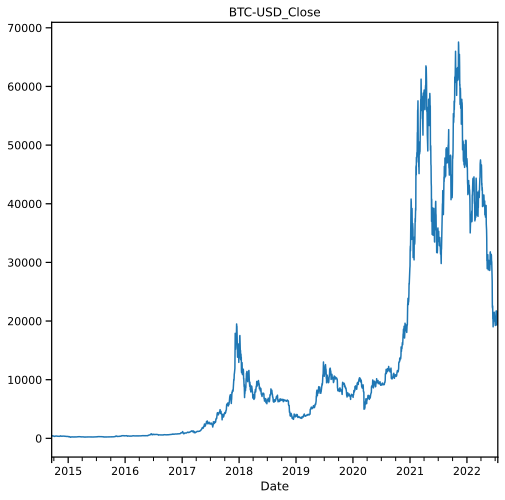

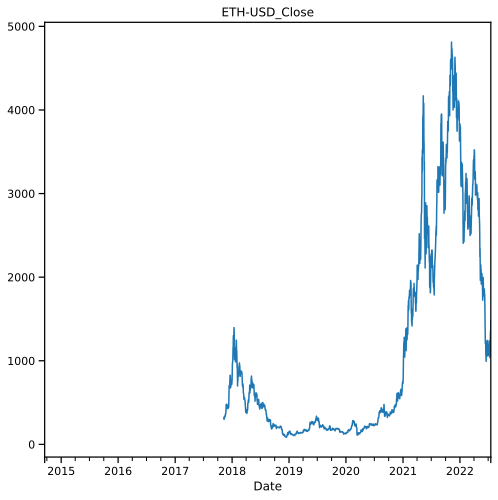

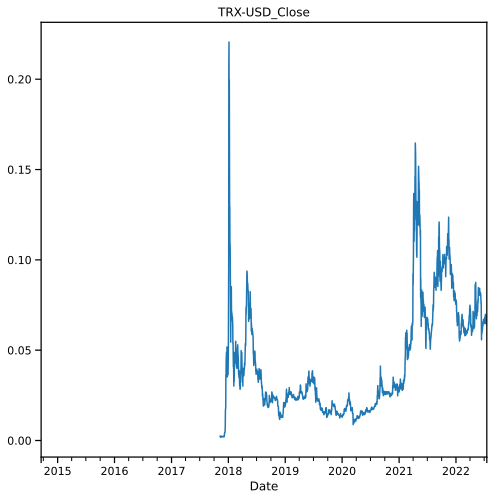

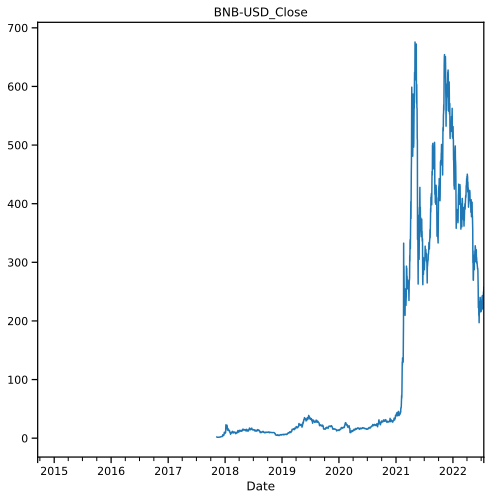

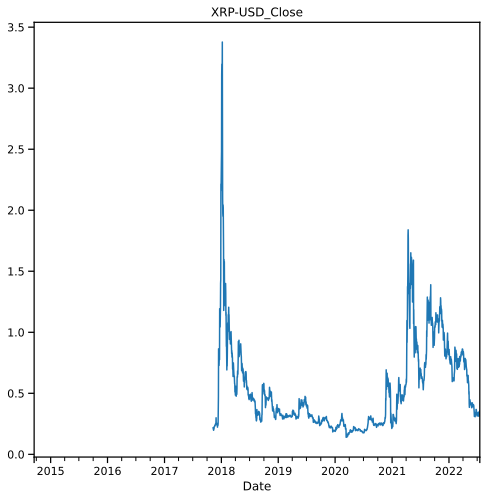

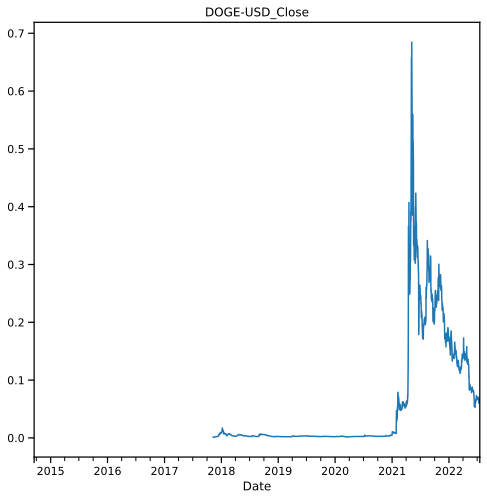

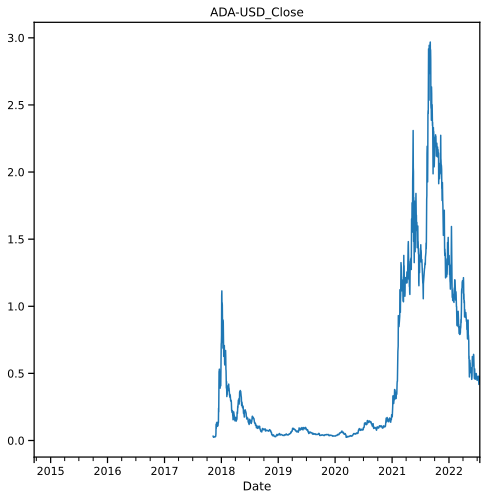

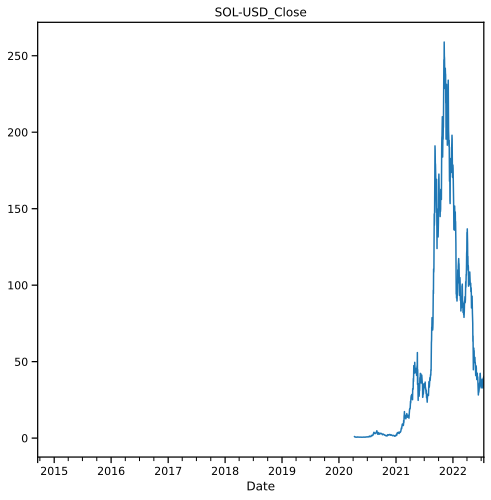

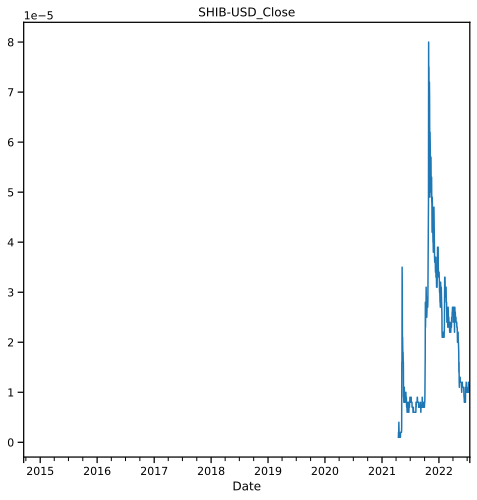

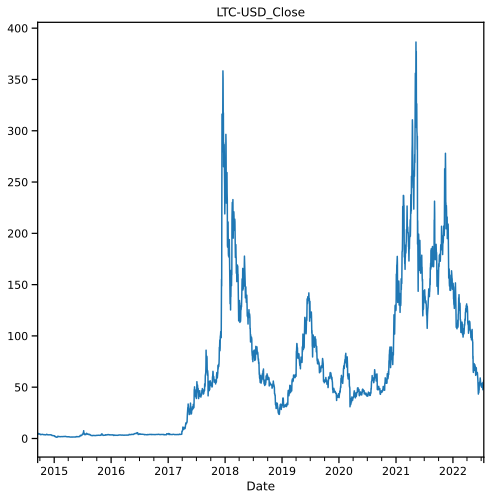

In [8]:
#année 2018
df = pd.read_csv('YahooF_Datas/cryptos/année_2018_DF.csv', index_col = 0, parse_dates = True)
affiche(df)

In [9]:
get_frame(df).describe()
#le mean est presque egal à 0.5 donc marche aléatoire
#il n'y a pas de chois à préviligier

,hurst
count,10.000000
mean,0.515054
std,0.043676
min,0.451259
25%,0.477384
50%,0.528747
75%,0.544016
max,0.574548


In [10]:
result1 = algo.run(df)

<AxesSubplot:xlabel='Date'>

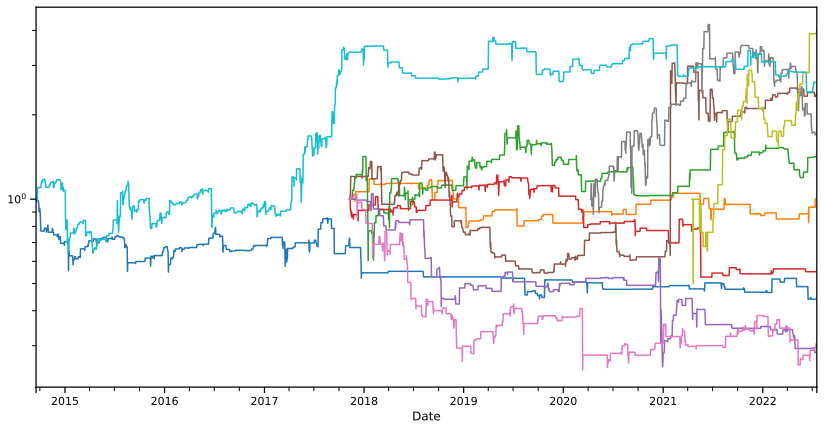

In [11]:
result1.plot_decomposition(legend=False, logy=True)

In [12]:
performance(result1)

Le ratio de Sharpe est :  0.5211416964445811
Le Beta est :  1.0016185302745864


In [13]:
#année 2019
a = pd.read_csv('YahooF_Datas/cryptos/année_2019_DF.csv', index_col = 0, parse_dates = True)
get_frame(a).describe()

,hurst
count,10.000000
mean,0.515054
std,0.043676
min,0.451259
25%,0.477384
50%,0.528747
75%,0.544016
max,0.574548


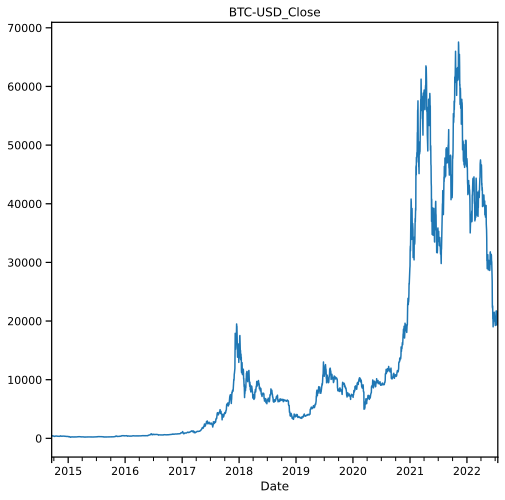

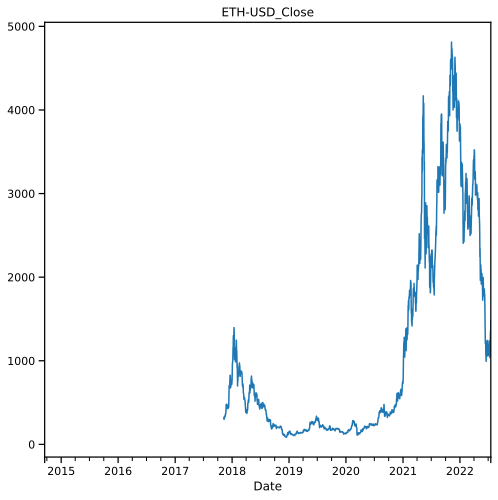

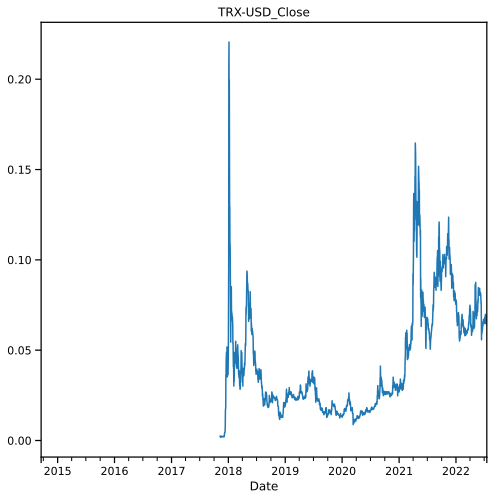

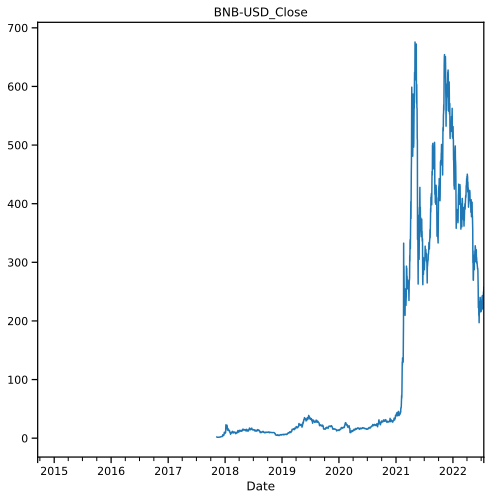

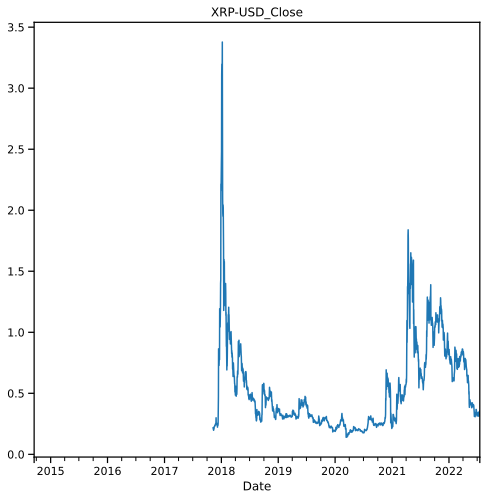

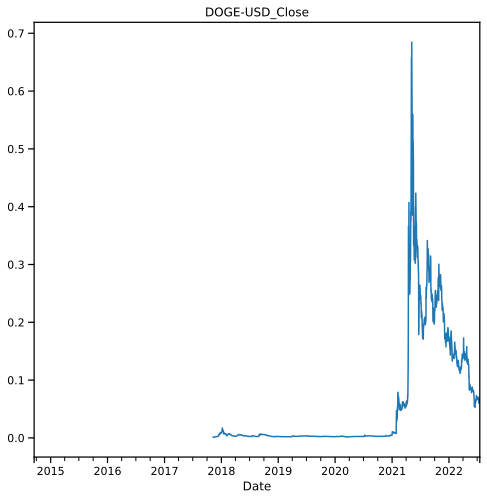

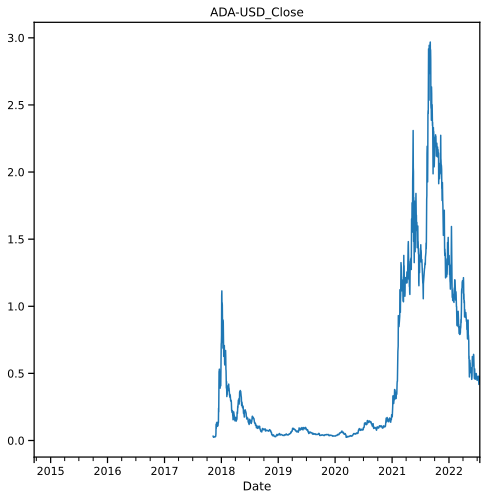

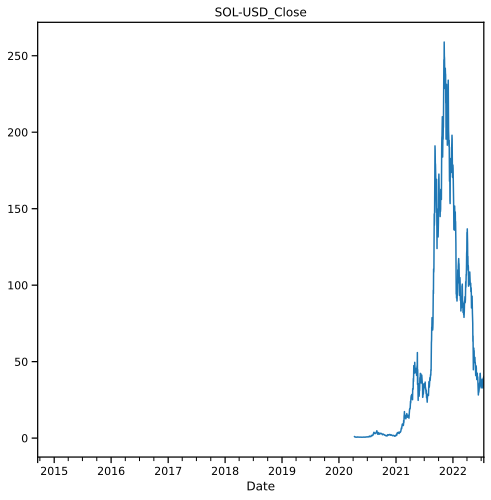

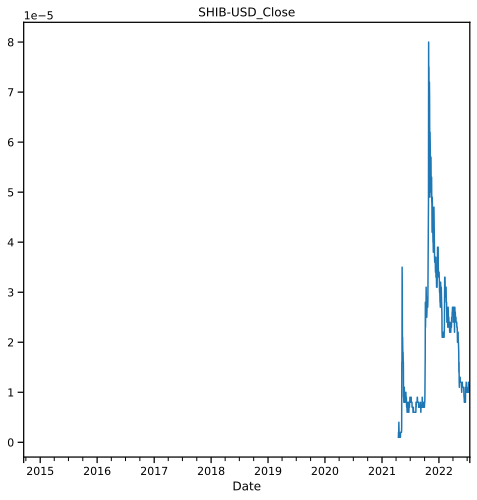

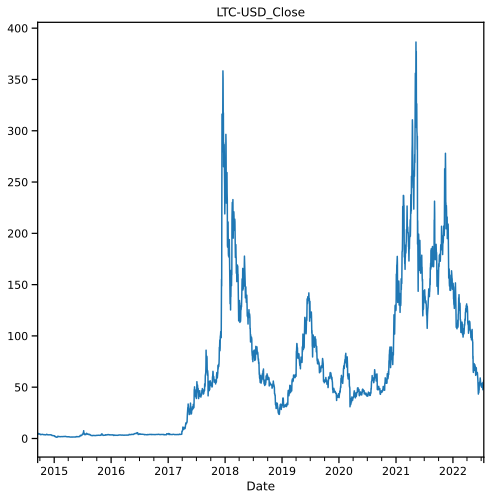

In [14]:
affiche(a)

In [15]:
result2 = algo.run(a)
performance(result2)

Le ratio de Sharpe est :  0.5211416964445811
Le Beta est :  1.0016185302745864


<AxesSubplot:xlabel='Date'>

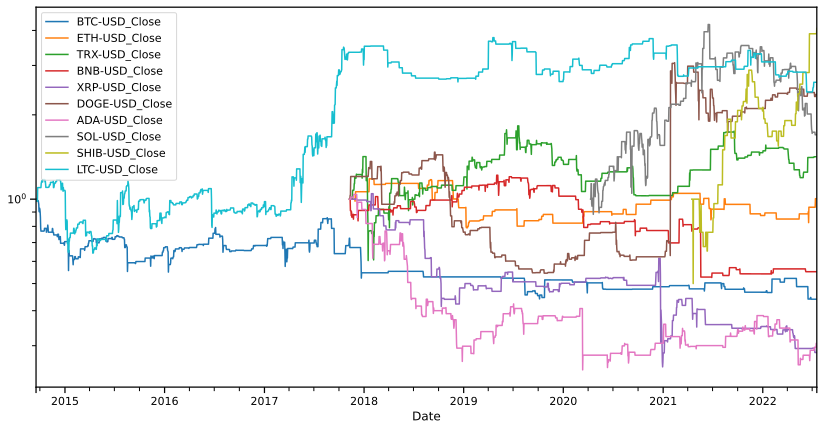

In [30]:
result2.plot_decomposition(legend=True, logy=True)

In [17]:
#Covid
b = pd.read_csv('YahooF_Datas/cryptos/covid_DF.csv', index_col = 0, parse_dates = True)
get_frame(b).describe()

,hurst
count,10.000000
mean,0.515055
std,0.043675
min,0.451261
25%,0.477385
50%,0.528748
75%,0.544016
max,0.574546


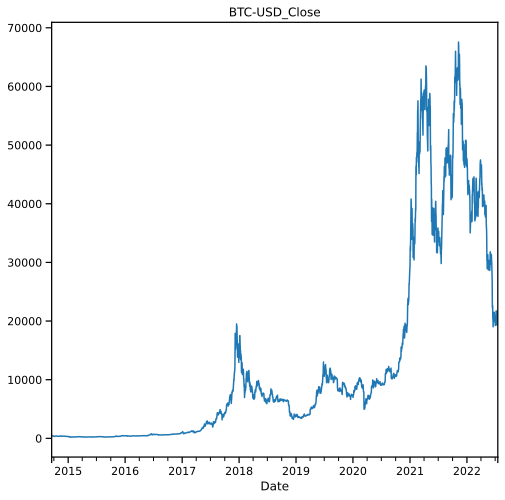

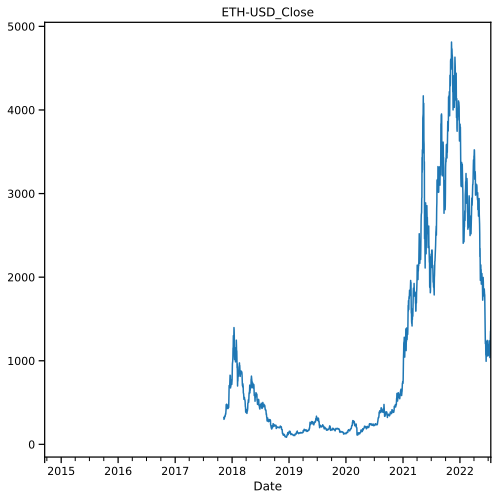

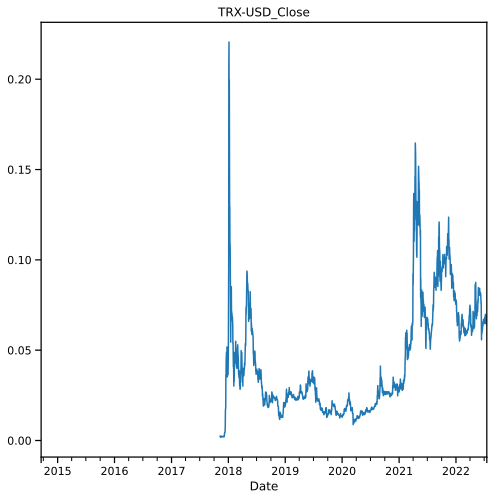

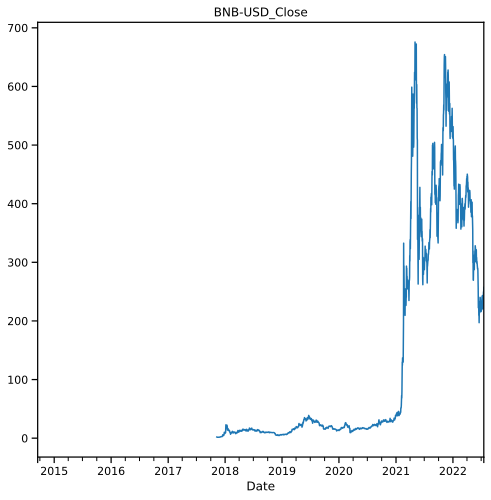

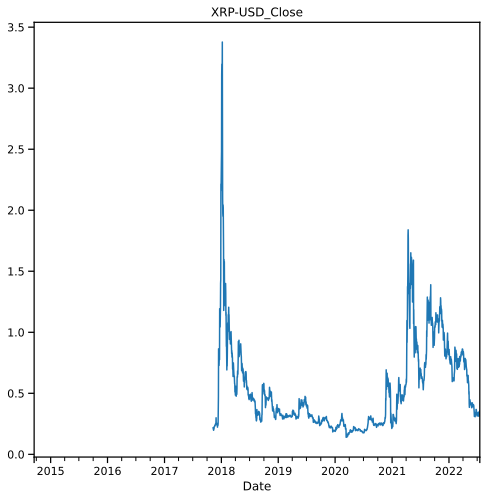

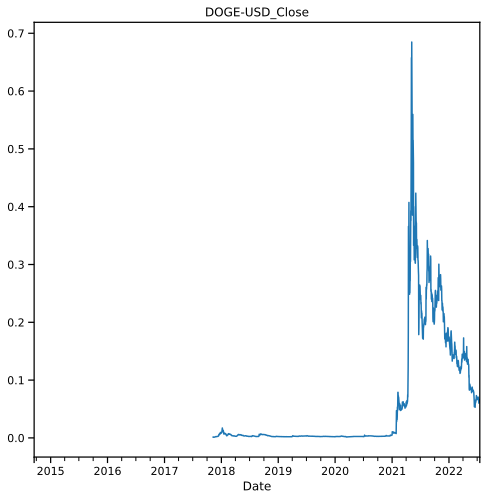

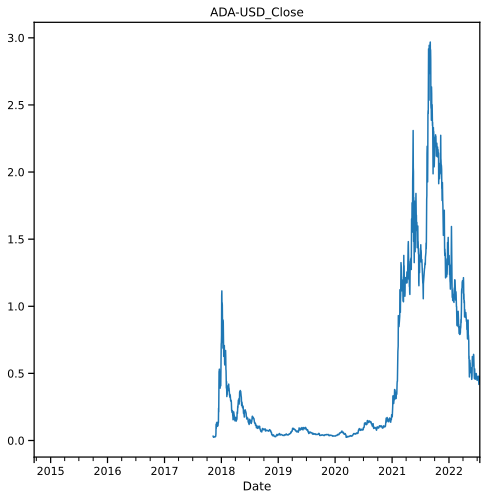

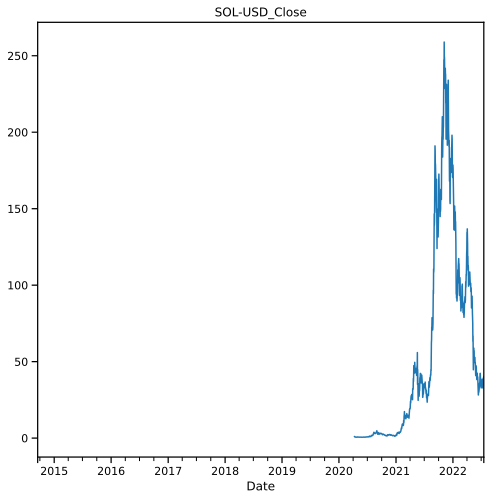

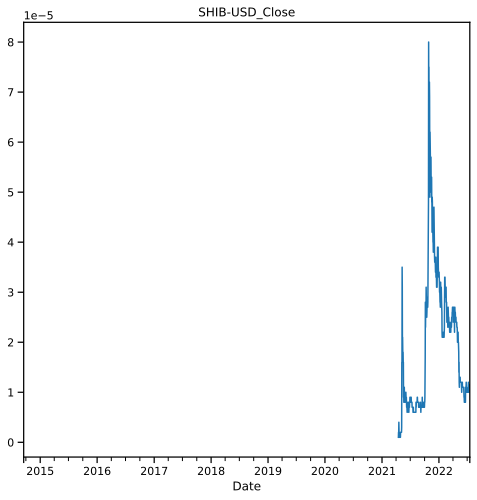

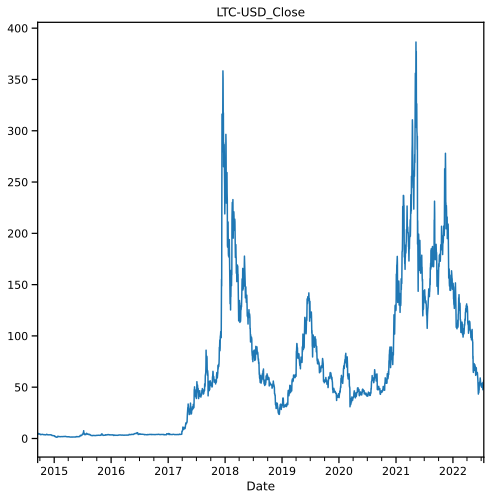

In [18]:
affiche(b)

In [19]:
result3 = algo.run(b)
performance(result3)

Le ratio de Sharpe est :  0.5212275544108068
Le Beta est :  1.0016250701703528


<AxesSubplot:xlabel='Date'>

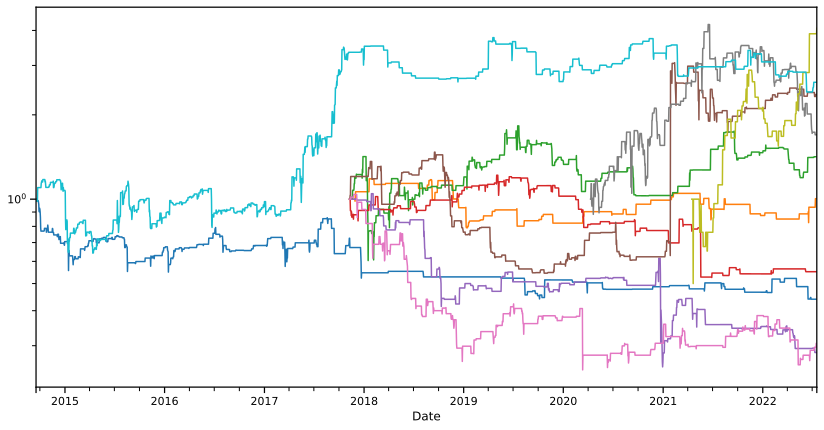

In [20]:
result3.plot_decomposition(legend=False, logy=True)

In [22]:
#guerre en ukraine
c = pd.read_csv('YahooF_Datas/cryptos/ukr_war_DF.csv', index_col = 0, parse_dates = True)
get_frame(c).describe()

,hurst
count,10.000000
mean,0.515054
std,0.043676
min,0.451259
25%,0.477384
50%,0.528747
75%,0.544017
max,0.574546


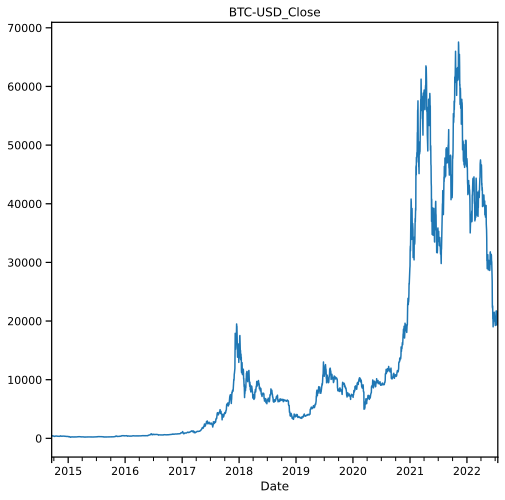

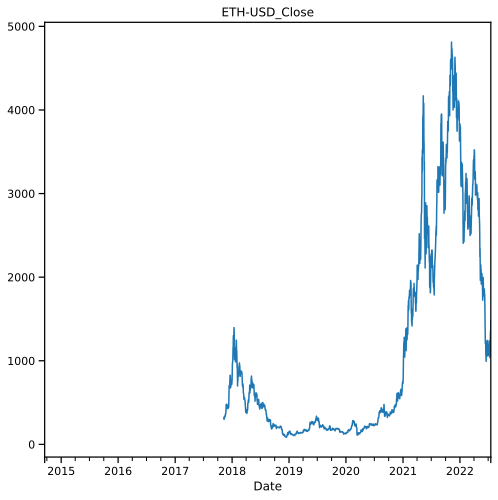

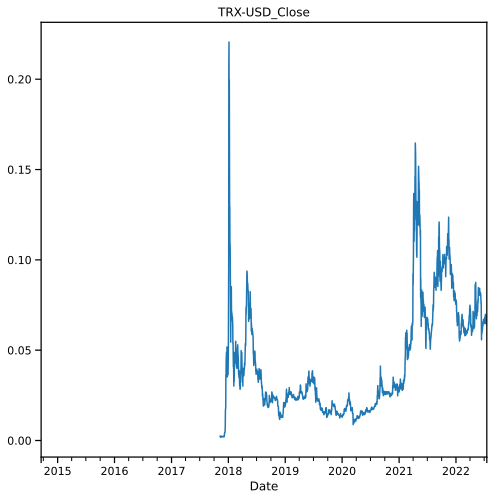

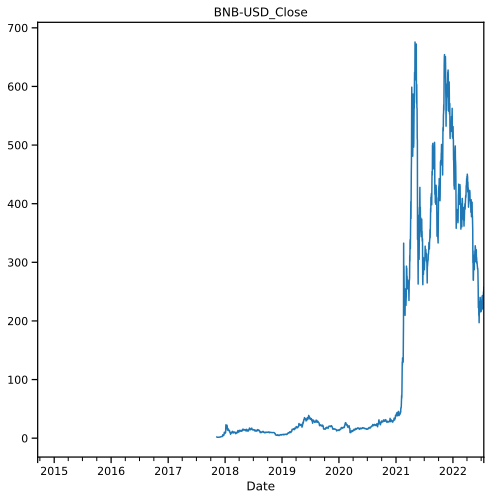

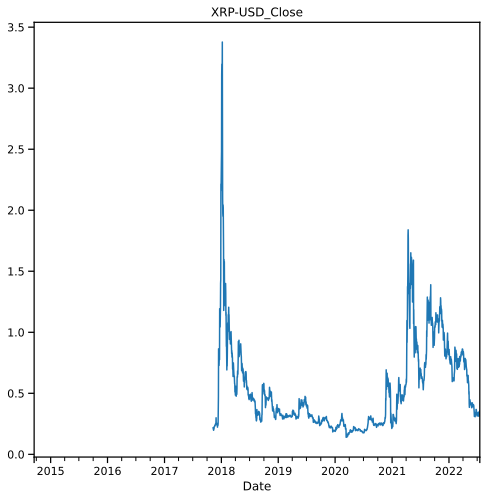

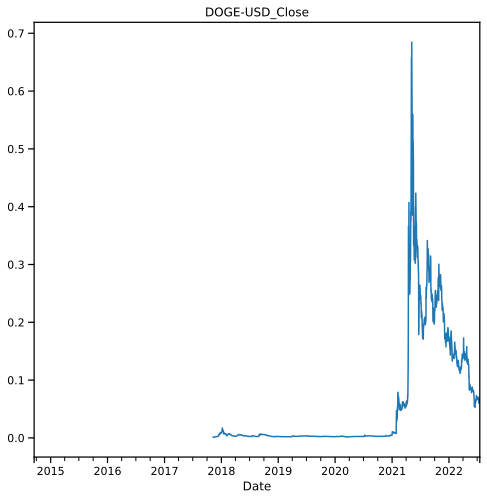

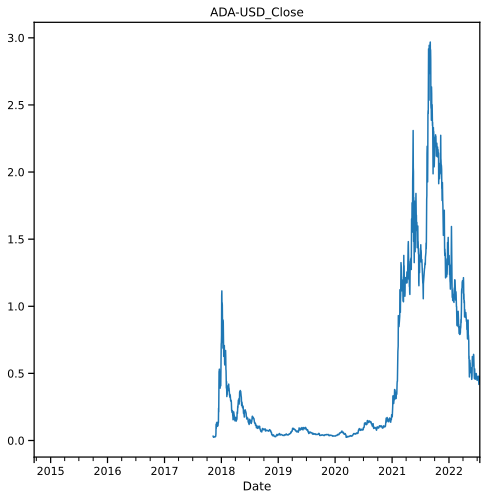

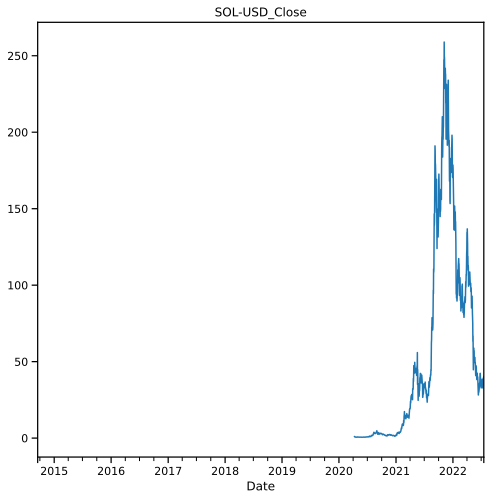

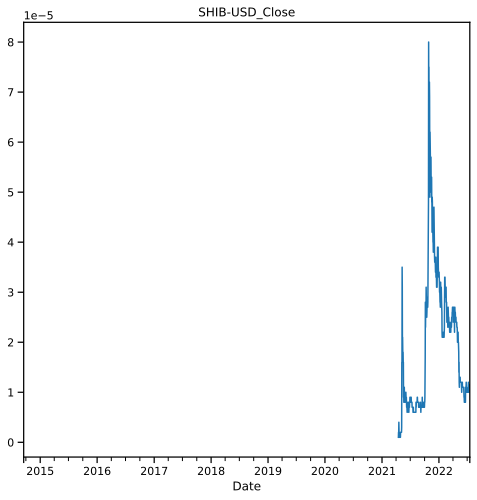

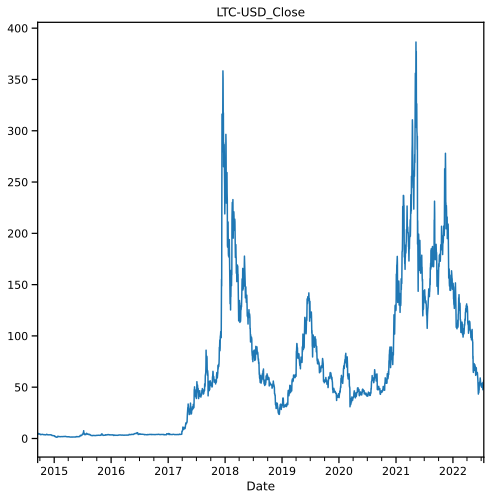

In [23]:
affiche(c)

In [24]:
result4 = algo.run(c)
performance(result4)

Le ratio de Sharpe est :  0.5212275544108068
Le Beta est :  1.0016249667193446


<AxesSubplot:xlabel='Date'>

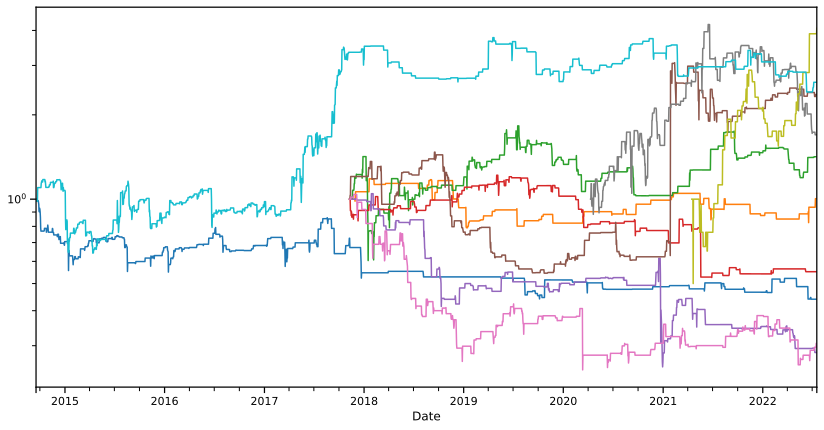

In [25]:
result4.plot_decomposition(legend=False, logy=True)

## nasdaq

In [26]:
#année 2018
d = pd.read_csv('YahooF_Datas/nasdaq/année_2018_DF.csv', index_col = 0, parse_dates = True)
get_frame(d).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


/var/folders/12/84yzr4v96cs825ywcskr493c0000gn/T/ipykernel_1206/311777973.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


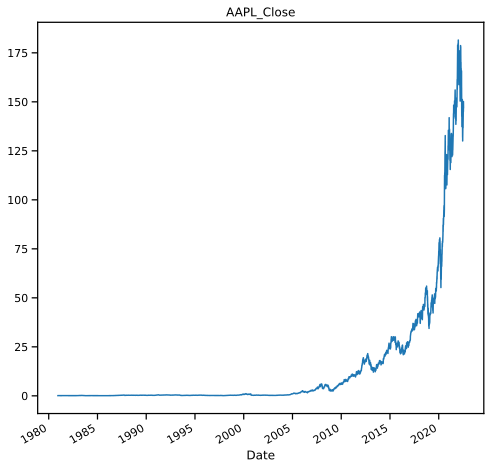

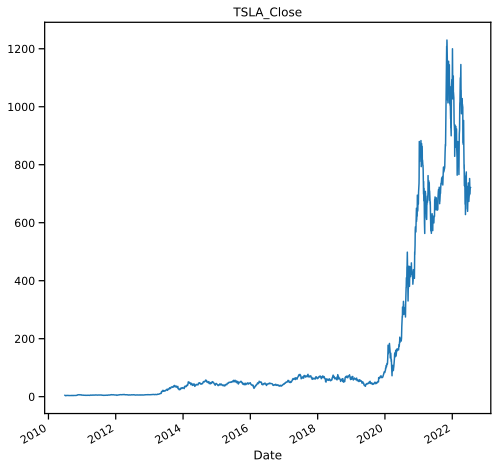

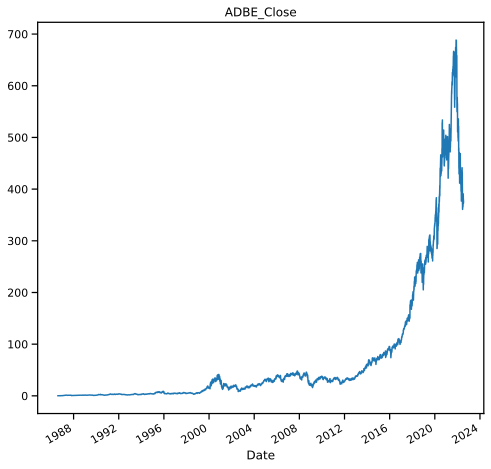

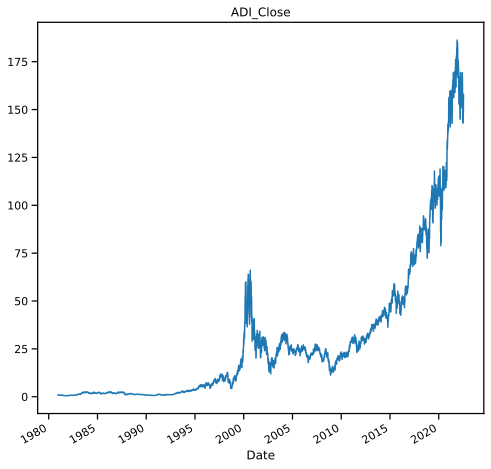

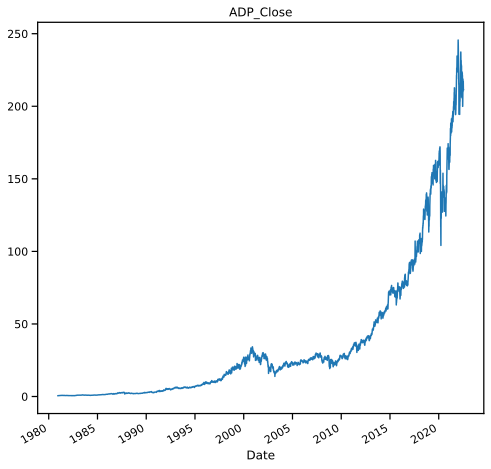

...

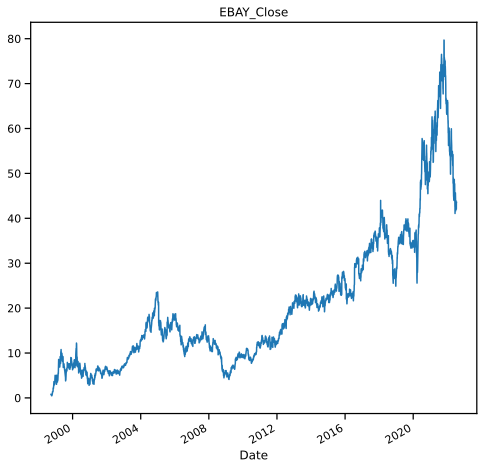

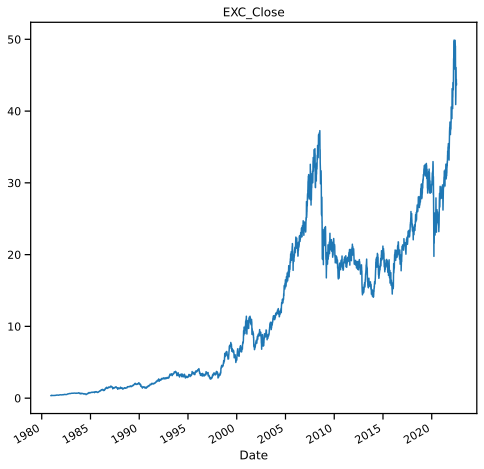

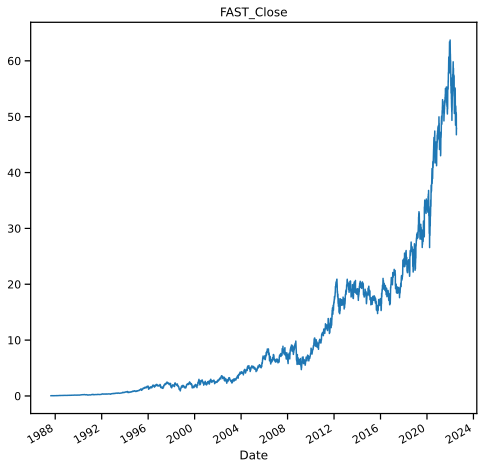

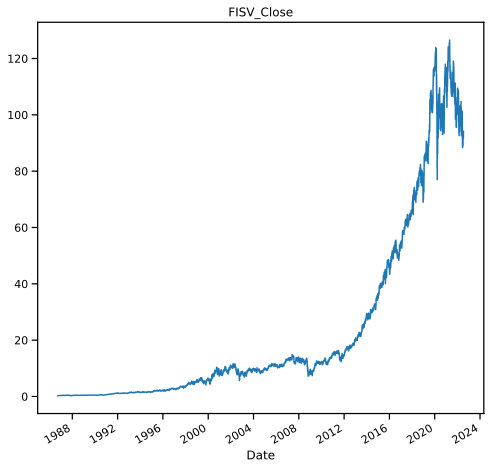

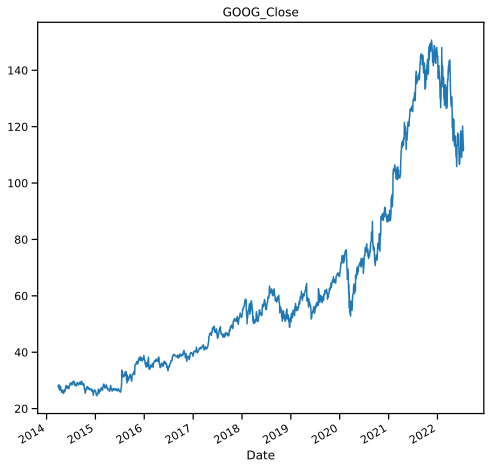

In [27]:
affiche(d)

In [28]:
result5 = algo.run(d)
performance(result5)

Le ratio de Sharpe est :  1.179512269108018
Le Beta est :  1.3772837348621567


<AxesSubplot:xlabel='Date'>

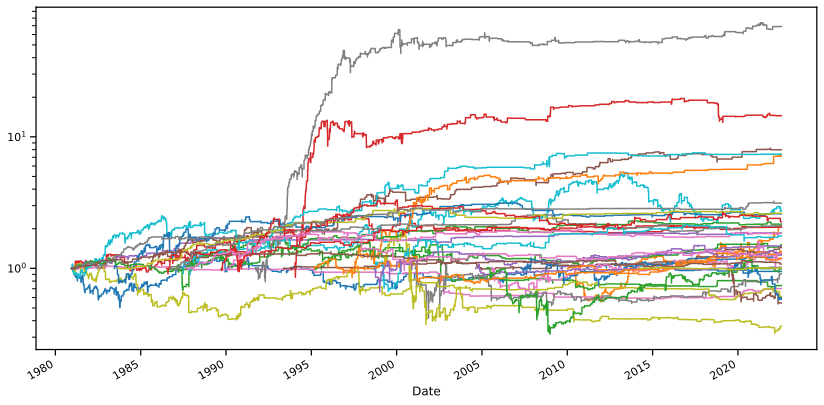

In [29]:
result5.plot_decomposition(legend=False, logy=True)

In [34]:
#année 2019
e = pd.read_csv('YahooF_Datas/nasdaq/année_2019_DF.csv', index_col = 0, parse_dates = True)
get_frame(e).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


In [35]:
result6 = algo.run(e)
performance(result6)

Le ratio de Sharpe est :  1.179513368031109
Le Beta est :  1.3772838708979802


<AxesSubplot:xlabel='Date'>

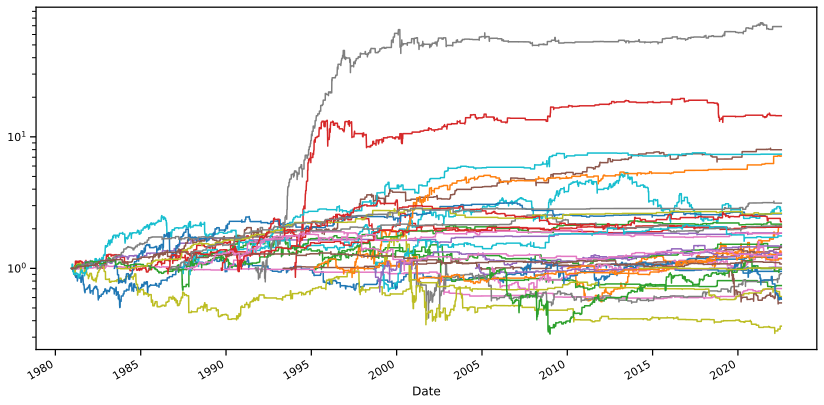

In [36]:
result6.plot_decomposition(legend=False, logy=True)

In [217]:
#Covid
f = pd.read_csv('YahooF_Datas/nasdaq/covid_DF.csv', index_col = 0, parse_dates = True)
get_frame(f).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


/var/folders/12/84yzr4v96cs825ywcskr493c0000gn/T/ipykernel_3962/311777973.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,8))


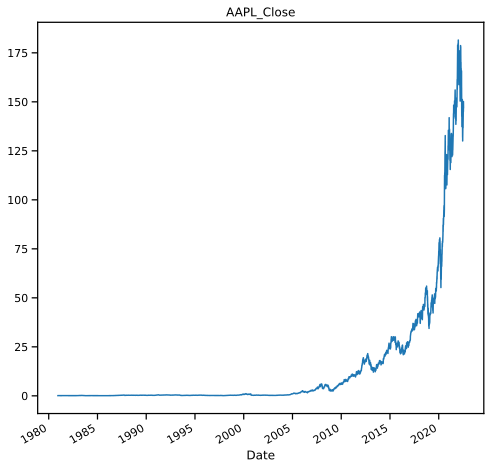

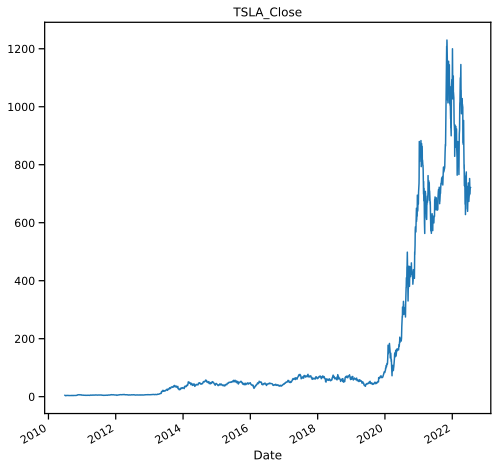

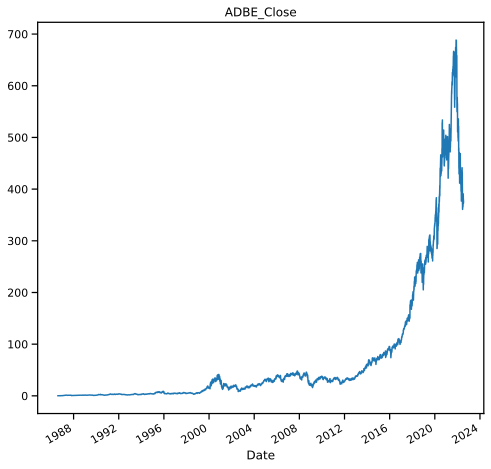

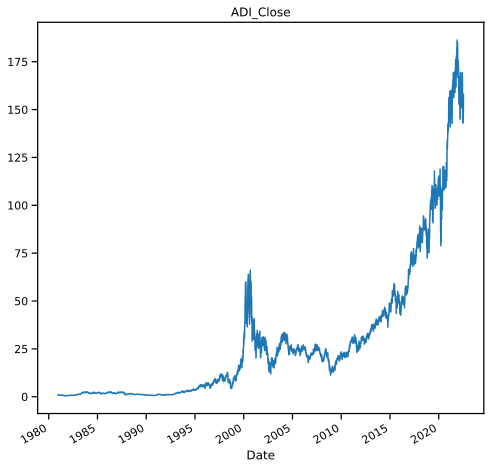

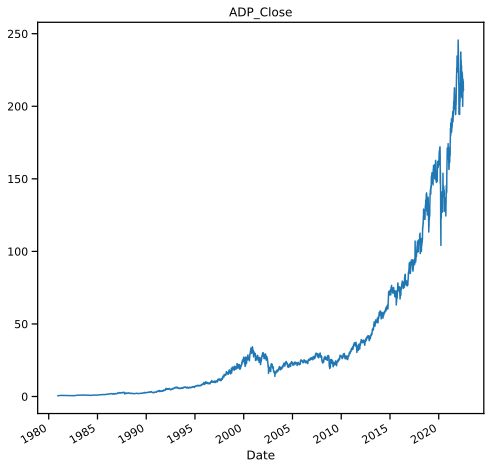

...

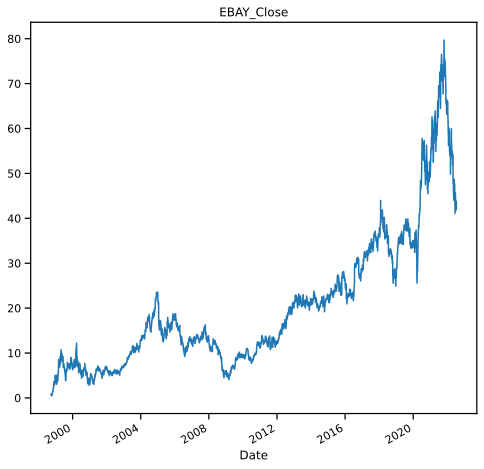

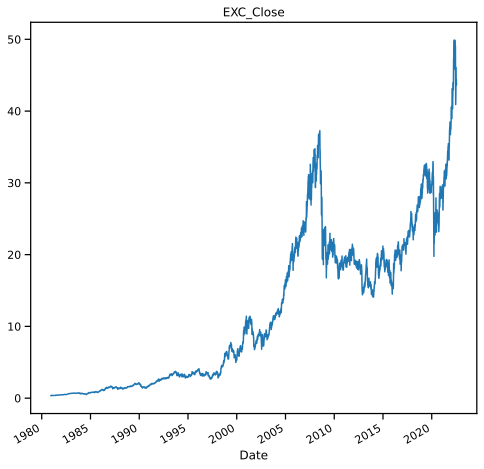

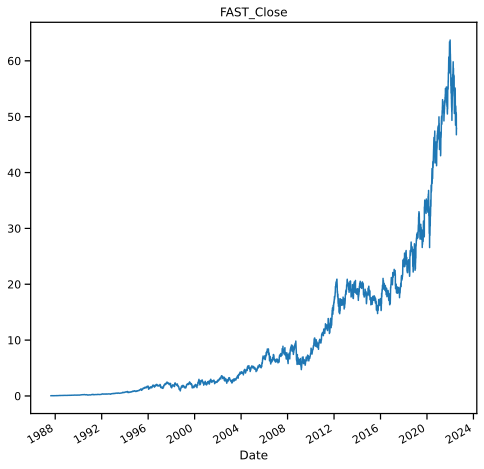

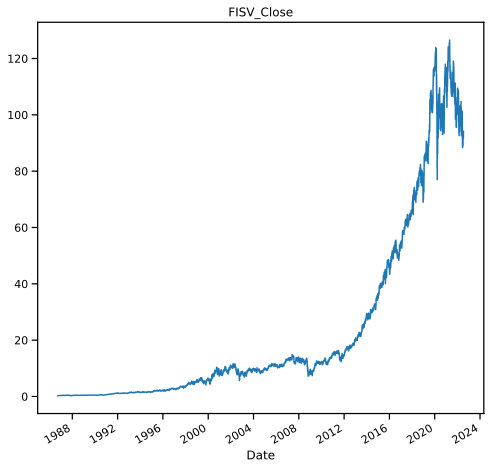

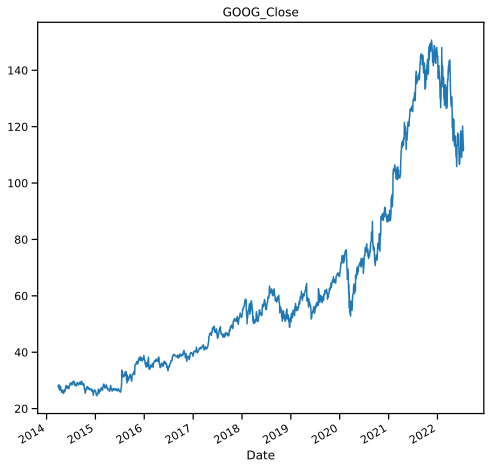

In [218]:
affiche(f)

In [197]:
result7 = algo.run(f)
performance(result7)

Le ratio de Sharpe est :  1.1795176164524983
Le Beta est :  1.377283922131426


In [198]:
#new millenium
g = pd.read_csv('YahooF_Datas/nasdaq/new_millennium_DF.csv', index_col = 0, parse_dates = True)
get_frame(g).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


In [199]:
result8 = algo.run(g)
performance(result8)

Le ratio de Sharpe est :  1.1795109165907052
Le Beta est :  1.3772852559542867


In [200]:
#subprimes
h = pd.read_csv('YahooF_Datas/nasdaq/subprimes_DF.csv', index_col = 0, parse_dates = True)
get_frame(h).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


In [201]:
result9 = algo.run(h)
performance(result9)

Le ratio de Sharpe est :  1.179516117515636
Le Beta est :  1.3772830767478625


In [202]:
#guerre en ukraine
k = pd.read_csv('YahooF_Datas/nasdaq/ukr_war_DF.csv', index_col = 0, parse_dates = True)
get_frame(k).describe()

,hurst
count,39.000000
mean,0.553547
std,0.064770
min,0.365838
25%,0.530962
50%,0.571223
75%,0.593815
max,0.655186


In [203]:
result10 = algo.run(k)
performance(result10)

Le ratio de Sharpe est :  1.179511623568181
Le Beta est :  1.3772839423767191
